In [1]:
import pandas as pd
import numpy as np

In [157]:
df=pd.read_csv("ShopSphere_V3_Enterprise_Dataset/cart_abandoment_dataset.csv")

In [3]:
# Understanding the data
df.head()

,Session_ID,Customer_ID,Pages_Viewed,Session_Duration,Device_Type,Traffic_Source,Age,Annual_Income,Loyalty_Tier,App_User_Flag,Tenure_Months,Total_Orders,Total_Revenue,Avg_Order_Value,Recency_Days,Campaign_Response_Rate,Web_Purchase_Rate,Purchase_After_Cart
0,WEB00002006,C000048,8,8.9,Desktop,Organic,26,1930953.0,Bronze,1,45,7,89764.52,12823.50,365,0.0,0.000,0
1,WEB00003006,C000073,8,15.2,Android,NaN,52,941008.0,Gold,1,26,7,179754.23,25679.18,365,0.0,0.571,0
2,WEB00000296,C000134,5,5.9,Tablet,Direct,36,458330.0,Silver,0,98,5,73284.40,14656.88,365,0.5,0.571,0
3,WEB00001146,C000162,8,5.9,Tablet,Referral,41,751866.0,Bronze,1,45,9,345391.55,38376.84,365,0.0,0.200,0
4,WEB00001057,C000183,7,17.1,iOS,Social,32,779665.0,Silver,1,4,3,34643.03,11547.68,365,0.0,0.200,1


In [4]:
df.shape

(160313, 18)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160313 entries, 0 to 160312
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Session_ID              160313 non-null  object 
 1   Customer_ID             160313 non-null  object 
 2   Pages_Viewed            160313 non-null  int64  
 3   Session_Duration        160313 non-null  float64
 4   Device_Type             160313 non-null  object 
 5   Traffic_Source          157085 non-null  object 
 6   Age                     160313 non-null  int64  
 7   Annual_Income           160313 non-null  float64
 8   Loyalty_Tier            160313 non-null  object 
 9   App_User_Flag           160313 non-null  int64  
 10  Tenure_Months           160313 non-null  int64  
 11  Total_Orders            160313 non-null  int64  
 12  Total_Revenue           160313 non-null  float64
 13  Avg_Order_Value         160313 non-null  float64
 14  Recency_Days        

In [158]:
# Bcoz only 2% of data is missing, we are filling it with Unknown

df["Traffic_Source"] = df["Traffic_Source"].fillna("Unknown")

In [7]:
df.isnull().sum()

Session_ID                0
Customer_ID               0
Pages_Viewed              0
Session_Duration          0
Device_Type               0
Traffic_Source            0
Age                       0
Annual_Income             0
Loyalty_Tier              0
App_User_Flag             0
Tenure_Months             0
Total_Orders              0
Total_Revenue             0
Avg_Order_Value           0
Recency_Days              0
Campaign_Response_Rate    0
Web_Purchase_Rate         0
Purchase_After_Cart       0
dtype: int64

In [159]:
# Removing not needed columns, Bcoz we can't predict anything from it
df_original = df.copy()

In [11]:
df["Purchase_After_Cart"].value_counts()

Purchase_After_Cart
0    109329
1     50984
Name: count, dtype: int64

In [12]:
df["Purchase_After_Cart"].value_counts(normalize=True)*100

# Nearly 7 out of every 10 customers who add products to their cart abandon the checkout process.

Purchase_After_Cart
0    68.197214
1    31.802786
Name: proportion, dtype: float64

In [13]:
num_cols = [
    "Pages_Viewed",
    "Session_Duration",
    "Age",
    "Annual_Income",
    "Tenure_Months",
    "Total_Orders",
    "Total_Revenue",
    "Avg_Order_Value",,
    "Campaign_Response_Rate",
    "Web_Purchase_Rate"
]

In [14]:
cat_cols = [
    "Device_Type",
    "Traffic_Source",
    "Loyalty_Tier",
    "App_User_Flag"
]

In [15]:
# Univariate Analysis
df[num_cols].describe().T

# .T create the transpose of the table to know the summary of the table in a better way

,count,mean,std,min,25%,50%,75%,max
Pages_Viewed,160313.0,7.729192e+00,2.923174,1.0,6.000,7.00,10.00,2.400000e+01
Session_Duration,160313.0,8.854145e+00,5.718325,0.0,4.700,7.70,11.80,5.550000e+01
Age,160313.0,3.617438e+01,10.530890,18.0,28.000,36.00,43.00,7.500000e+01
Annual_Income,160313.0,1.027428e+06,985982.665665,0.0,411123.000,814319.00,1201143.00,3.416659e+07
Tenure_Months,160313.0,6.050675e+01,34.723532,1.0,30.000,60.00,90.00,1.200000e+02
Total_Orders,160313.0,5.994997e+00,2.452452,0.0,4.000,6.00,8.00,1.900000e+01
Total_Revenue,160313.0,1.343887e+05,136714.897850,0.0,55823.060,103290.72,171706.68,2.590141e+06
Avg_Order_Value,160313.0,2.223231e+04,22118.136389,0.0,10859.720,17718.81,27123.91,6.518475e+05
Recency_Days,160313.0,3.650000e+02,0.000000,365.0,365.000,365.00,365.00,3.650000e+02
Campaign_Response_Rate,160313.0,6.374988e-02,0.186915,0.0,0.000,0.00,0.00,1.000000e+00


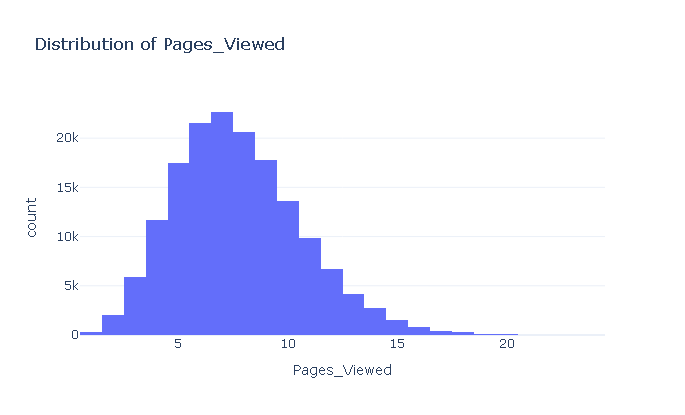

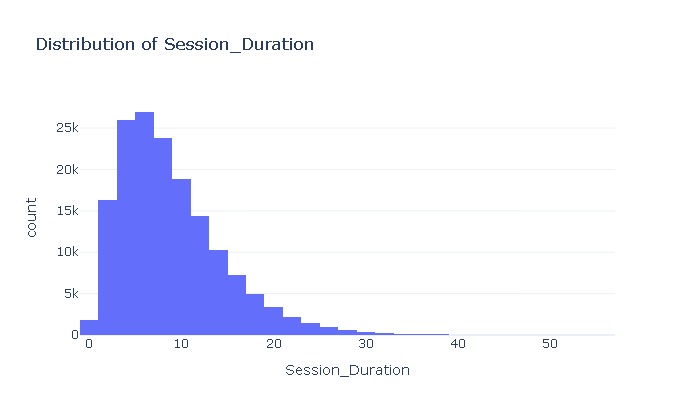

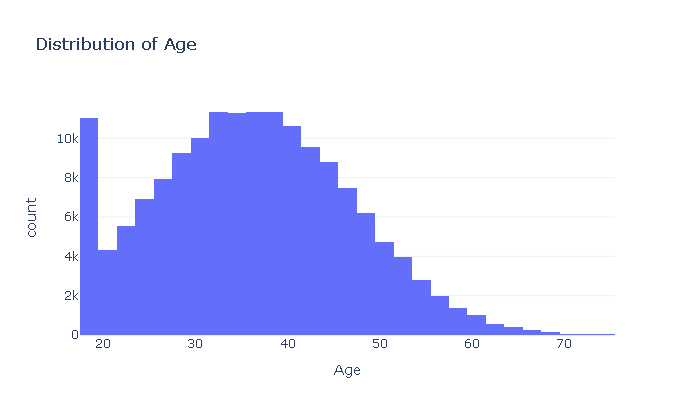

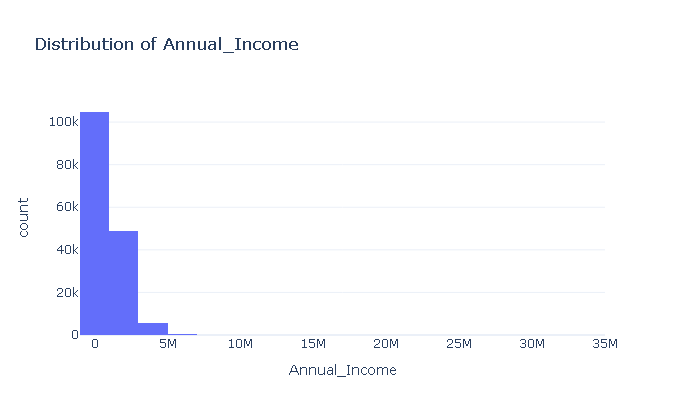

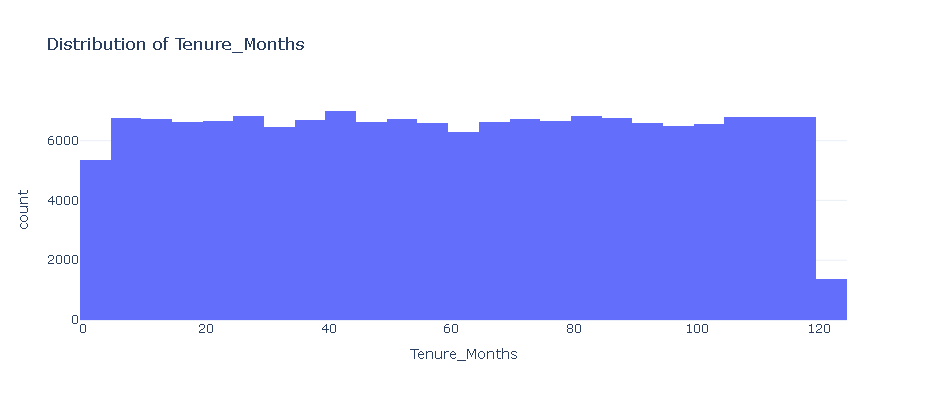

...

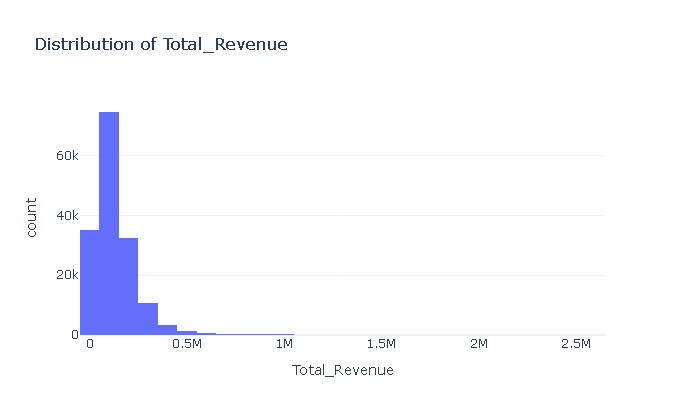

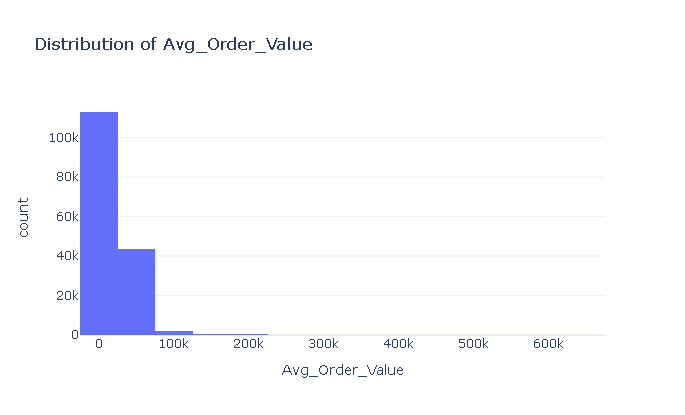

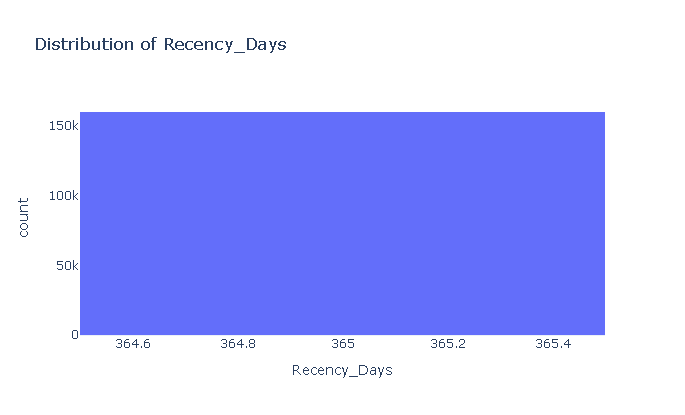

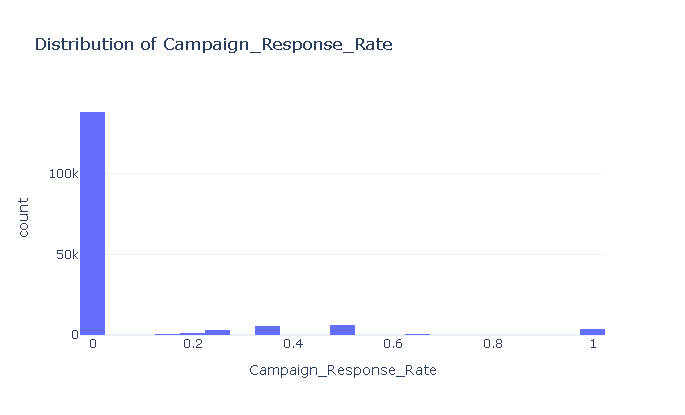

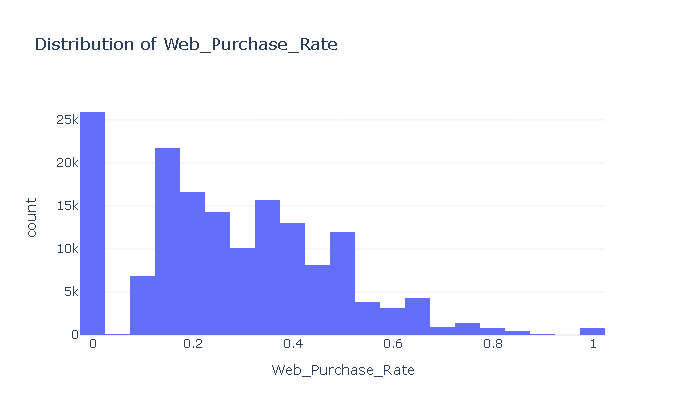

In [16]:
import plotly.express as px

for col in num_cols:
    # Create an interactive histogram
    fig = px.histogram(
        df, 
        x=col, 
        nbins=30, 
        title=f"Distribution of {col}",
        template="plotly_white" # Makes the background clean and light
    )
    
    # Update layout to make it look clean
    fig.update_layout(
        width=700,
        height=400,
        showlegend=False
    )
    
    # Display the interactive plot
    fig.show()


In [17]:
print(df["Recency_Days"].nunique())

1


In [160]:
df = df.drop("Recency_Days", axis=1)

In [18]:
df.groupby("Purchase_After_Cart").mean(numeric_only=True).T

Purchase_After_Cart,0,1
Pages_Viewed,7.453164e+00,8.321101e+00
Session_Duration,8.495332e+00,9.623574e+00
Age,3.614025e+01,3.624759e+01
Annual_Income,1.027911e+06,1.026393e+06
App_User_Flag,5.072853e-01,5.520948e-01
Tenure_Months,6.046921e+01,6.058726e+01
Total_Orders,5.990789e+00,6.004021e+00
Total_Revenue,1.346354e+05,1.338598e+05
Avg_Order_Value,2.231024e+04,2.206521e+04
Recency_Days,3.650000e+02,3.650000e+02


In [19]:
for col in cat_cols:
    print(df[col].value_counts())
    print("-"*50)

Device_Type
Android    72066
iOS        40152
Desktop    40129
Tablet      7966
Name: count, dtype: int64
--------------------------------------------------
Traffic_Source
Organic        53469
Paid Search    34428
Direct         31386
Social         25152
Referral       12650
Unknown         3228
Name: count, dtype: int64
--------------------------------------------------
Loyalty_Tier
Bronze      65463
Silver      50342
Gold        33364
Platinum    11144
Name: count, dtype: int64
--------------------------------------------------
App_User_Flag
1    83609
0    76704
Name: count, dtype: int64
--------------------------------------------------


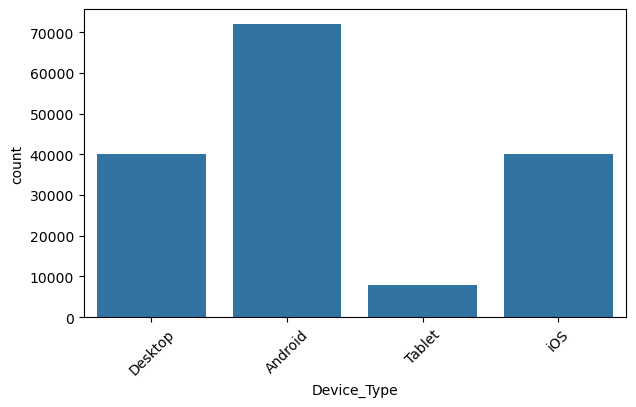

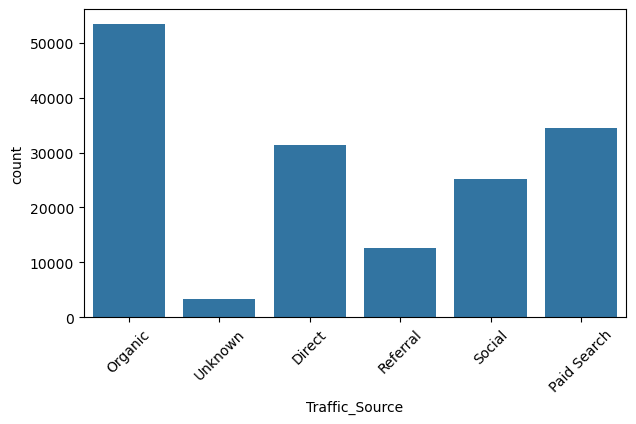

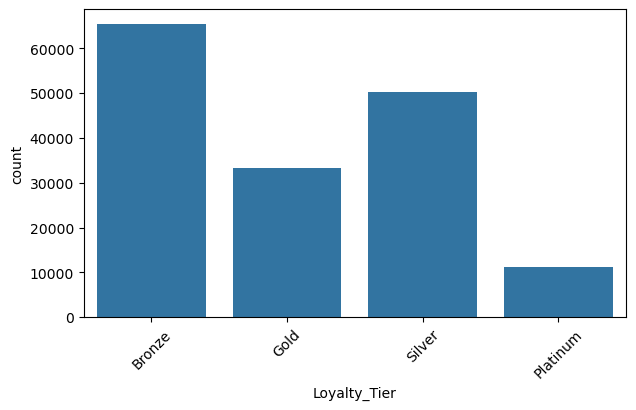

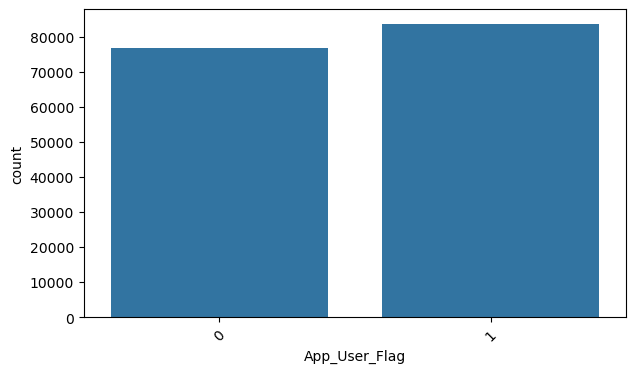

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in cat_cols:
    plt.figure(figsize=(7,4))
    sns.countplot(data=df,x=col)
    plt.xticks(rotation=45)
    plt.show()

In [21]:
# Bivariate Analysis(Target variable analysis)
df.groupby("Purchase_After_Cart")["Pages_Viewed"].mean()

Purchase_After_Cart
0    7.453164
1    8.321101
Name: Pages_Viewed, dtype: float64

In [22]:
df.groupby("Purchase_After_Cart")["Session_Duration"].mean()

Purchase_After_Cart
0    8.495332
1    9.623574
Name: Session_Duration, dtype: float64

In [23]:
df.groupby("Purchase_After_Cart")["Age"].mean()

Purchase_After_Cart
0    36.140246
1    36.247587
Name: Age, dtype: float64

In [24]:
df.groupby("Purchase_After_Cart")["Annual_Income"].mean()

Purchase_After_Cart
0    1.027911e+06
1    1.026393e+06
Name: Annual_Income, dtype: float64

In [25]:
df.groupby("Purchase_After_Cart")["Total_Orders"].mean()

Purchase_After_Cart
0    5.990789
1    6.004021
Name: Total_Orders, dtype: float64

In [26]:
df.groupby("Purchase_After_Cart")["Total_Revenue"].mean()

Purchase_After_Cart
0    134635.387625
1    133859.829332
Name: Total_Revenue, dtype: float64

In [27]:
df.groupby("Purchase_After_Cart")["Recency_Days"].mean()

Purchase_After_Cart
0    365.0
1    365.0
Name: Recency_Days, dtype: float64

In [28]:
df.groupby("Purchase_After_Cart")["Campaign_Response_Rate"].mean()

Purchase_After_Cart
0    0.060459
1    0.070806
Name: Campaign_Response_Rate, dtype: float64

In [29]:
pd.crosstab(
    df["Loyalty_Tier"],
    df["Purchase_After_Cart"],
    normalize="index"
)*100

Purchase_After_Cart,0,1
Loyalty_Tier,,
Bronze,75.566350,24.433650
Gold,60.259561,39.740439
Platinum,53.068916,46.931084
Silver,67.224187,32.775813


In [30]:
pd.crosstab(
    df["Device_Type"],
    df["Purchase_After_Cart"],
    normalize="index"
)*100

Purchase_After_Cart,0,1
Device_Type,,
Android,68.159742,31.840258
Desktop,68.347081,31.652919
Tablet,68.616621,31.383379
iOS,68.031480,31.968520


In [31]:
pd.crosstab(
    df["Traffic_Source"],
    df["Purchase_After_Cart"],
    normalize="index"
)*100

Purchase_After_Cart,0,1
Traffic_Source,,
Direct,67.683043,32.316957
Organic,68.521947,31.478053
Paid Search,68.130591,31.869409
Referral,68.537549,31.462451
Social,68.026399,31.973601
Unknown,68.525403,31.474597


In [32]:
pd.crosstab(
    df["App_User_Flag"],
    df["Purchase_After_Cart"],
    normalize="index"
)*100

Purchase_After_Cart,0,1
App_User_Flag,,
0,70.228411,29.771589
1,66.333768,33.666232


In [33]:
# Statistical Validation
from scipy.stats import ttest_ind

In [34]:
# Test 1
# Question: Do purchasers view more pages than abandoners?
# Hypothesis
# H0: Average pages viewed is the same
# H1: Average pages viewed is different
purchased = df[df["Purchase_After_Cart"] == 1]["Pages_Viewed"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Pages_Viewed"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

# It proves purchasers view significantly more pages than abandoners.
# Pages viewed significantly affect purchase behaviour.

T Statistic: 55.901620777270146
P Value: 0.0


In [35]:
# Test 2: Session Duration
# Question: Do purchasers spend more time browsing?

purchased = df[df["Purchase_After_Cart"] == 1]["Session_Duration"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Session_Duration"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

T Statistic: 36.94650562354544
P Value: 1.4967812281756476e-297


In [36]:
# Test 3: Total Orders
# Question: Are repeat customers more likely to complete checkout?
purchased = df[df["Purchase_After_Cart"] == 1]["Total_Orders"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Total_Orders"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

T Statistic: 1.0060327337597
P Value: 0.3144013426037317


In [37]:
# Test 4: Total Revenue
# Question: Are historically valuable customers less likely to abandon?
purchased = df[df["Purchase_After_Cart"] == 1]["Total_Revenue"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Total_Revenue"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

T Statistic: -1.0577889724797667
P Value: 0.29015325529523195


In [38]:
# Test 5: Campaign Response Rate
# Question: Does marketing engagement influence checkout completion?

purchased = df[df["Purchase_After_Cart"] == 1]["Campaign_Response_Rate"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Campaign_Response_Rate"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

T Statistic: 10.325263747675718
P Value: 5.515625001716852e-25


In [39]:
# Test 6: Web Purchase Rate
# Question: Does previous online buying behaviour influence future purchases?
purchased = df[df["Purchase_After_Cart"] == 1]["Web_Purchase_Rate"]

abandoned = df[df["Purchase_After_Cart"] == 0]["Web_Purchase_Rate"]

t_stat, p_value = ttest_ind(
    purchased,
    abandoned
)

print("T Statistic:", t_stat)
print("P Value:", p_value)

T Statistic: 204.87695453547173
P Value: 0.0


In [40]:
ttest_ind(purchased, abandoned, equal_var=False)

TtestResult(statistic=np.float64(198.6987192798303), pvalue=np.float64(0.0), df=np.float64(92381.92460306312))

In [41]:
# Chi Square Test
from scipy.stats import chi2_contingency

In [42]:
pd.crosstab(
    df["Loyalty_Tier"],
    df["Purchase_After_Cart"]
)

Purchase_After_Cart,0,1
Loyalty_Tier,,
Bronze,49468,15995
Gold,20105,13259
Platinum,5914,5230
Silver,33842,16500


In [43]:
# Test 1: Loyalty Tier
# Question: Is loyalty tier associated with purchase completion?
# Hypothesis
# H0: Loyalty Tier and Purchase are independent
# H1: Loyalty Tier and Purchase are related

from scipy.stats import chi2_contingency

table = pd.crosstab(
    df["Loyalty_Tier"],
    df["Purchase_After_Cart"]
)

chi2, p_value, dof, expected = chi2_contingency(table)

print("Chi Square Statistic:", chi2)
print("P Value:", p_value)
print("Degrees of Freedom:", dof)

Chi Square Statistic: 3806.235029023791
P Value: 0.0
Degrees of Freedom: 3


In [44]:
# Test 2: Device Type
# Question: Does device influence checkout completion?

table = pd.crosstab(
    df["Device_Type"],
    df["Purchase_After_Cart"]
)

chi2,
p_value,
dof,
expected = chi2_contingency(table)

print("P Value:", p_value)

P Value: 0.0


In [45]:
# Test 3: Traffic Source
# Question: Does the acquisition channel influence purchase?

table = pd.crosstab(
    df["Traffic_Source"],
    df["Purchase_After_Cart"]
)

chi2,
p_value,
dof,
expected = chi2_contingency(table)

print("P Value:", p_value)

P Value: 0.0


In [46]:
# Test 4: App User Flag
# Question: Are app users more likely to complete checkout?

table = pd.crosstab(
    df["App_User_Flag"],
    df["Purchase_After_Cart"]
)

chi2,
p_value,
dof,
expected = chi2_contingency(table)

print("P Value:", p_value)

P Value: 0.0


In [47]:
from scipy.stats import ttest_ind

results = []

for col in num_cols:

    purchased = df[df["Purchase_After_Cart"] == 1][col]
    abandoned = df[df["Purchase_After_Cart"] == 0][col]

    t_stat, p_value = ttest_ind(
        purchased,
        abandoned
    )

    results.append(
        [col,p_value]
    )

pd.DataFrame(
    results,
    columns=["Feature","P_Value"]
).sort_values("P_Value")

C:\Users\balaj\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:579: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



,Feature,P_Value
0,Pages_Viewed,0.000000e+00
10,Web_Purchase_Rate,0.000000e+00
1,Session_Duration,1.496781e-297
9,Campaign_Response_Rate,5.515625e-25
7,Avg_Order_Value,3.885396e-02
2,Age,5.734825e-02
6,Total_Revenue,2.901533e-01
5,Total_Orders,3.144013e-01
4,Tenure_Months,5.261095e-01
3,Annual_Income,7.739813e-01


In [161]:
df["Cart_Abandonment_Flag"] = 1 - df["Purchase_After_Cart"]

In [162]:
# Engagement Score

df["Engagement_Score"] = df["Pages_Viewed"] * df["Session_Duration"]
# A customer viewing many pages and spending more time is more engaged.

In [163]:
# Pages Per Minute

df["Pages_Per_Minute"] = df["Pages_Viewed"] / (df["Session_Duration"] + 1)
# Because some sessions may have Session_Duration = 0. This avoids division error.

In [164]:
#High Engagement Flag

df["High_Engagement_Flag"] = np.where(
    (df["Pages_Viewed"] >= 8) & (df["Session_Duration"] >= 9),
    1,
    0
)
#Customers with high page views and longer sessions are more likely to complete checkout.

In [165]:
# Loyalty-Based Feature

loyalty_mapping = {
    "Bronze": 1,
    "Silver": 2,
    "Gold": 3,
    "Platinum": 4
}

df["Loyalty_Score"] = df["Loyalty_Tier"].map(loyalty_mapping)

# Higher loyalty customers are more likely to trust ShopSphere and complete purchases.

In [166]:
# Campaign Engagement Features
df["Campaign_Responder_Flag"] = np.where(
    df["Campaign_Response_Rate"] > 0,
    1,
    0
)

#Customers who respond to campaigns are more engaged and more purchase-ready.

In [167]:
# Web Buyer Flag

df["Web_Buyer_Flag"] = np.where(
    df["Web_Purchase_Rate"] > 0,
    1,
    0
)
# Customers who have previously purchased online are more likely to purchase again.

In [168]:
# Revenue Per Tenure Month

df["Revenue_Per_Tenure"] = df["Total_Revenue"] / (df["Tenure_Months"] + 1)
# A customer with ₹1,00,000 revenue in 10 months is different from a customer with ₹1,00,000 revenue in 100 months. This measures monthly customer value.

In [169]:
# Orders Per Tenure Month

df["Orders_Per_Tenure"] = df["Total_Orders"] / (df["Tenure_Months"] + 1)
# This measures purchase frequency adjusted for how long the customer has been with ShopSphere.

In [170]:
# High Value Customer Flag

df["High_Value_Customer_Flag"] = np.where(
    df["Total_Revenue"] >= df["Total_Revenue"].quantile(0.75),
    1,
    0
)
# Top 25% revenue customers may behave differently. This helps identify premium-value customers.

In [171]:
# Skewed Feature Transformation
# Bcoz logistic regression may suffer in skewed data
df["Annual_Income_Log"] = np.log1p(df["Annual_Income"])
df["Total_Revenue_Log"] = np.log1p(df["Total_Revenue"])
df["Avg_Order_Value_Log"] = np.log1p(df["Avg_Order_Value"])
df["Session_Duration_Log"] = np.log1p(df["Session_Duration"])

#Log transformation reduces the impact of extreme high-value customers and makes the data more balanced for modeling.

In [172]:
# Age Group Feature

df["Age_Group"] = pd.cut(
    df["Age"],
    bins=[17, 25, 35, 45, 60, 100],
    labels=["18-25", "26-35", "36-45", "46-60", "60+"]
)
# This helps identify which age segment has higher abandonment or conversion behavior.

In [173]:
# Tenure Group Feature
df["Tenure_Group"] = pd.cut(
    df["Tenure_Months"],
    bins=[0, 12, 36, 72, 120],
    labels=["New", "Growing", "Established", "Long-Term"]
)
# New customers and long-term customers may behave differently during checkout.

In [174]:
df["Campaign_Engagement_Level"] = pd.cut(
    df["Campaign_Response_Rate"],
    bins=[-0.01, 0, 0.3, 0.7, 1.0],
    labels=["No Response", "Low", "Medium", "High"]
)

df["Web_Purchase_Level"] = pd.cut(
    df["Web_Purchase_Rate"],
    bins=[-0.01, 0, 0.25, 0.50, 1.0],
    labels=["No Web Purchase", "Low", "Medium", "High"]
)

In [175]:
df.head()

,Session_ID,Customer_ID,Pages_Viewed,Session_Duration,Device_Type,Traffic_Source,Age,Annual_Income,Loyalty_Tier,App_User_Flag,...,Orders_Per_Tenure,High_Value_Customer_Flag,Annual_Income_Log,Total_Revenue_Log,Avg_Order_Value_Log,Session_Duration_Log,Age_Group,Tenure_Group,Campaign_Engagement_Level,Web_Purchase_Level
0,WEB00002006,C000048,8,8.9,Desktop,Organic,26,1930953.0,Bronze,1,...,0.152174,0,14.473525,11.404956,9.459113,2.292535,26-35,Established,No Response,No Web Purchase
1,WEB00003006,C000073,8,15.2,Android,Unknown,52,941008.0,Gold,1,...,0.259259,1,13.754708,12.099351,10.153475,2.785011,46-60,Growing,No Response,High
2,WEB00000296,C000134,5,5.9,Tablet,Direct,36,458330.0,Silver,0,...,0.050505,0,13.035347,11.202117,9.592733,1.931521,36-45,Long-Term,Medium,High
3,WEB00001146,C000162,8,5.9,Tablet,Referral,41,751866.0,Bronze,1,...,0.195652,1,13.530315,12.752437,10.555235,1.931521,36-45,Established,No Response,Low
4,WEB00001057,C000183,7,17.1,iOS,Social,32,779665.0,Silver,1,...,0.600000,0,13.566621,10.452881,9.354326,2.895912,26-35,New,No Response,Low


In [176]:
df.shape

(160313, 35)

In [179]:
logistic_features = [
    "Pages_Viewed",
    "Session_Duration_Log",
    "Age",
    "Annual_Income_Log",
    "App_User_Flag",
    "Tenure_Months",
    "Total_Orders",
    "Total_Revenue_Log",
    "Avg_Order_Value_Log",
    "Campaign_Response_Rate",
    "Web_Purchase_Rate",
    "Loyalty_Score",
    "Engagement_Score",
    "Pages_Per_Minute",
    "High_Engagement_Flag",
    "Campaign_Responder_Flag",
    "Web_Buyer_Flag",
    "Revenue_Per_Tenure",
    "Orders_Per_Tenure",
    "High_Value_Customer_Flag",
    "Device_Type",
    "Traffic_Source",
    "Loyalty_Tier",
    "Age_Group",
    "Tenure_Group",
    "Campaign_Engagement_Level",
    "Web_Purchase_Level"
]

X_log = df[logistic_features]

y = df["Purchase_After_Cart"]

In [181]:
tree_features = [
    "Pages_Viewed",
    "Session_Duration",
    "Age",
    "Annual_Income",
    "App_User_Flag",
    "Tenure_Months",
    "Total_Orders",
    "Total_Revenue",
    "Avg_Order_Value",
    "Campaign_Response_Rate",
    "Web_Purchase_Rate",
    "Loyalty_Score",
    "Engagement_Score",
    "Pages_Per_Minute",
    "High_Engagement_Flag",
    "Campaign_Responder_Flag",
    "Web_Buyer_Flag",
    "Revenue_Per_Tenure",
    "Orders_Per_Tenure",
    "High_Value_Customer_Flag",
    "Device_Type",
    "Traffic_Source",
    "Loyalty_Tier",
    "Age_Group",
    "Tenure_Group",
    "Campaign_Engagement_Level",
    "Web_Purchase_Level"
]

X_tree = df[tree_features]

In [182]:
from sklearn.model_selection import train_test_split

train_idx, test_idx = train_test_split(
    df.index,
    test_size=0.2,
    random_state=42,
    stratify=y
)

X_log_train = X_log.loc[train_idx]
X_log_test = X_log.loc[test_idx]

X_tree_train = X_tree.loc[train_idx]
X_tree_test = X_tree.loc[test_idx]

y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

In [71]:
categorical_cols = X_train.select_dtypes(include=["object", "category"]).columns.tolist()

categorical_cols

['Device_Type',
 'Traffic_Source',
 'Loyalty_Tier',
 'Campaign_Engagement_Level',
 'Web_Purchase_Level',
 'Age_Group',
 'Tenure_Group']

In [183]:
# Logistic Encoding

cat_cols_log = X_log_train.select_dtypes(include=["object", "category"]).columns.tolist()

X_log_train_encoded = pd.get_dummies(
    X_log_train,
    columns=cat_cols_log,
    drop_first=True
)

X_log_test_encoded = pd.get_dummies(
    X_log_test,
    columns=cat_cols_log,
    drop_first=True
)

X_log_train_encoded, X_log_test_encoded = X_log_train_encoded.align(
    X_log_test_encoded,
    join="left",
    axis=1,
    fill_value=0
)

X_log_train_encoded = X_log_train_encoded.astype(float)
X_log_test_encoded = X_log_test_encoded.astype(float)

In [184]:
# Tree Encoding 
cat_cols_tree = X_tree_train.select_dtypes(include=["object", "category"]).columns.tolist()

X_tree_train_encoded = pd.get_dummies(
    X_tree_train,
    columns=cat_cols_tree,
    drop_first=True
)

X_tree_test_encoded = pd.get_dummies(
    X_tree_test,
    columns=cat_cols_tree,
    drop_first=True
)

X_tree_train_encoded, X_tree_test_encoded = X_tree_train_encoded.align(
    X_tree_test_encoded,
    join="left",
    axis=1,
    fill_value=0
)

X_tree_train_encoded = X_tree_train_encoded.astype(float)
X_tree_test_encoded = X_tree_test_encoded.astype(float)

In [185]:
# Scale only Logistic data

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_log_train_scaled = scaler.fit_transform(X_log_train_encoded)

X_log_test_scaled = scaler.transform(X_log_test_encoded)

In [186]:
X_tree_train_encoded
X_tree_test_encoded

,Pages_Viewed,Session_Duration,Age,Annual_Income,App_User_Flag,Tenure_Months,Total_Orders,Total_Revenue,Avg_Order_Value,Campaign_Response_Rate,...,Age_Group_60+,Tenure_Group_Growing,Tenure_Group_Established,Tenure_Group_Long-Term,Campaign_Engagement_Level_Low,Campaign_Engagement_Level_Medium,Campaign_Engagement_Level_High,Web_Purchase_Level_Low,Web_Purchase_Level_Medium,Web_Purchase_Level_High
90205,5.0,10.3,18.0,240145.0,0.0,67.0,10.0,203732.92,20373.29,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
150212,4.0,7.6,42.0,706596.0,0.0,59.0,8.0,123322.56,15415.32,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
54191,6.0,6.8,23.0,1293658.0,1.0,44.0,8.0,89572.78,11196.60,0.5,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2878,6.0,15.6,39.0,992186.0,0.0,49.0,9.0,52922.70,5880.30,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
65993,10.0,13.8,19.0,303307.0,0.0,70.0,3.0,3996.88,1332.29,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97972,7.0,4.6,40.0,214508.0,1.0,66.0,6.0,177289.87,29548.31,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
12426,11.0,16.4,60.0,416803.0,0.0,48.0,11.0,238535.41,21685.04,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3664,11.0,15.4,40.0,2268094.0,0.0,2.0,4.0,162314.38,40578.60,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
147389,6.0,5.3,19.0,401189.0,0.0,57.0,11.0,199336.99,18121.54,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [187]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_classification_model(model_name, model, X_train, X_test, y_train, y_test):
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    result = {
        "Model": model_name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred),
        "ROC-AUC": roc_auc_score(y_test, y_prob),
        "Train Accuracy": model.score(X_train, y_train),
        "Test Accuracy": model.score(X_test, y_test)
    }

    print(model_name)
    print("-" * 50)
    print(pd.DataFrame([result]))
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    return result

In [188]:
from sklearn.linear_model import LogisticRegression

log_model = LogisticRegression(
    max_iter=2000,
    random_state=42
)

log_model.fit(X_log_train_scaled, y_train)

log_result = evaluate_classification_model(
    "Logistic Regression",
    log_model,
    X_log_train_scaled,
    X_log_test_scaled,
    y_train,
    y_test
)

Logistic Regression
--------------------------------------------------
                 Model  Accuracy  Precision   Recall  F1 Score   ROC-AUC  \
0  Logistic Regression  0.737486   0.630844  0.42081  0.504853  0.785443   

   Train Accuracy  Test Accuracy  
0        0.737388       0.737486  

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.89      0.82     21866
           1       0.63      0.42      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



In [93]:
# SMOTE

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

X_train_smote, y_train_smote = smote.fit_resample(
    X_train_scaled,
    y_train
)

log_model_smote = LogisticRegression(
    max_iter=1000,
    random_state=42
)

log_model_smote.fit(X_train_smote, y_train_smote)

y_pred_smote = log_model_smote.predict(X_test_scaled)

y_prob_smote = log_model_smote.predict_proba(X_test_scaled)[:, 1]

In [94]:
print("Accuracy:", accuracy_score(y_test, y_pred_smote))
print("Precision:", precision_score(y_test, y_pred_smote))
print("Recall:", recall_score(y_test, y_pred_smote))
print("F1 Score:", f1_score(y_test, y_pred_smote))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_smote))

print(classification_report(y_test, y_pred_smote))

Accuracy: 0.6989988460218944
Precision: 0.5189425478767694
Recall: 0.733451015004413
F1 Score: 0.60782640497379
ROC-AUC: 0.7843613261804736
              precision    recall  f1-score   support

           0       0.85      0.68      0.76     21866
           1       0.52      0.73      0.61     10197

    accuracy                           0.70     32063
   macro avg       0.68      0.71      0.68     32063
weighted avg       0.74      0.70      0.71     32063



In [96]:
# GridSearch CV

from sklearn.model_selection import GridSearchCV

param_grid = {
    "C": [0.01, 0.1, 1, 10, 100],
    "penalty": ["l1", "l2"],
    "solver": ["liblinear"],
    "class_weight": [None, "balanced"]
}

grid_search = GridSearchCV(
    LogisticRegression(max_iter=2000, random_state=42),
    param_grid,
    cv=5,
    scoring="roc_auc",
    n_jobs=-1
)

grid_search.fit(X_train_scaled, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best CV Score:", grid_search.best_score_)

Best Parameters: {'C': 0.01, 'class_weight': None, 'penalty': 'l1', 'solver': 'liblinear'}
Best CV Score: 0.78373559688937


In [97]:
best_log_model = grid_search.best_estimator_

y_pred_grid = best_log_model.predict(X_test_scaled)

y_prob_grid = best_log_model.predict_proba(X_test_scaled)[:, 1]

In [98]:
print("Accuracy:", accuracy_score(y_test, y_pred_grid))
print("Precision:", precision_score(y_test, y_pred_grid))
print("Recall:", recall_score(y_test, y_pred_grid))
print("F1 Score:", f1_score(y_test, y_pred_grid))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_grid))

print(classification_report(y_test, y_pred_grid))

Accuracy: 0.7375479524685775
Precision: 0.6320782686036169
Recall: 0.41816220456997155
F1 Score: 0.5033347104999115
ROC-AUC: 0.7856881624443357
              precision    recall  f1-score   support

           0       0.77      0.89      0.82     21866
           1       0.63      0.42      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



In [99]:
business_output = df_original.loc[X_test.index, ["Session_ID", "Customer_ID"]].copy()

business_output["Actual_Purchase"] = y_test.values

business_output["Purchase_Probability"] = y_prob_grid

business_output["Abandonment_Risk"] = 1 - business_output["Purchase_Probability"]

business_output.sort_values("Abandonment_Risk", ascending=False).head(20)


# The baseline Logistic Regression model achieved 73.7% accuracy and 78.5% ROC-AUC. The model performed particularly well in identifying abandoned cart sessions, with recall of 88% for class 0. Since the business objective is to identify likely cart abandoners, this is a meaningful result. Class weighting and SMOTE were tested, but they reduced overall performance, likely because the class imbalance was moderate rather than severe.

,Session_ID,Customer_ID,Actual_Purchase,Purchase_Probability,Abandonment_Risk
148352,WEB00241832,C025907,0,0.001297,0.998703
90513,WEB00259567,C020712,0,0.001343,0.998657
94849,WEB00098210,C029052,0,0.001359,0.998641
104920,WEB00103057,C030959,0,0.001377,0.998623
111290,WEB00034562,C000269,0,0.001392,0.998608
8702,WEB00213895,C004248,0,0.001405,0.998595
79682,WEB00228897,C037424,0,0.001422,0.998578
1435,WEB00003958,C034562,0,0.001433,0.998567
155572,WEB00176561,C015243,0,0.001460,0.998540
126776,WEB00146437,C036252,0,0.001461,0.998539


In [100]:
# Decision Tree

from sklearn.tree import DecisionTreeClassifier

In [101]:
# Cart decision tree using GINI Impurity

cart_model = DecisionTreeClassifier(
    criterion="gini",
    random_state=50
)

cart_model.fit(X_train_encoded, y_train)

,criterion,'gini'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,50
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [102]:
y_pred_cart = cart_model.predict(X_test_encoded)

y_prob_cart = cart_model.predict_proba(X_test_encoded)[:, 1]

In [104]:
print("CART Decision Tree Results")
print("Accuracy:", accuracy_score(y_test, y_pred_cart))
print("Precision:", precision_score(y_test, y_pred_cart))
print("Recall:", recall_score(y_test, y_pred_cart))
print("F1 Score:", f1_score(y_test, y_pred_cart))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_cart))

print(classification_report(y_test, y_pred_cart))

CART Decision Tree Results
Accuracy: 0.6466955681003025
Precision: 0.4457449870478749
Recall: 0.45562420319701874
F1 Score: 0.45063045586808925
ROC-AUC: 0.5957120375721671
              precision    recall  f1-score   support

           0       0.74      0.74      0.74     21866
           1       0.45      0.46      0.45     10197

    accuracy                           0.65     32063
   macro avg       0.59      0.60      0.60     32063
weighted avg       0.65      0.65      0.65     32063



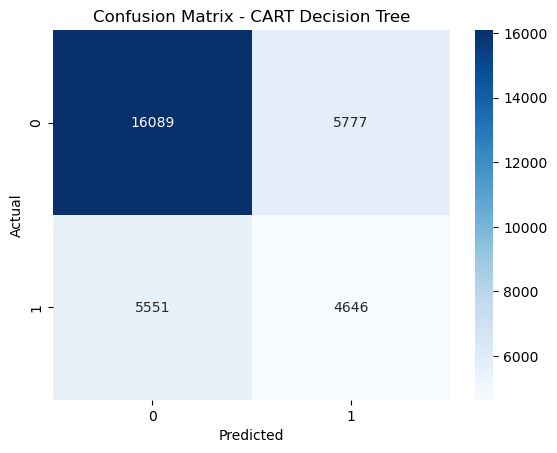

In [105]:
cm_cart = confusion_matrix(y_test, y_pred_cart)

sns.heatmap(cm_cart, annot=True, fmt="d", cmap="Blues")

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - CART Decision Tree")
plt.show()

In [106]:
# C4.5-like Decision Tree using Entropy

c45_model = DecisionTreeClassifier(
    criterion="entropy",
    random_state=50
)

c45_model.fit(X_train_encoded, y_train)

,criterion,'entropy'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,50
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,class_weight,None


In [107]:
y_pred_c45 = c45_model.predict(X_test_encoded)

y_prob_c45 = c45_model.predict_proba(X_test_encoded)[:, 1]

In [108]:
print("C4.5-like Decision Tree Results")
print("Accuracy:", accuracy_score(y_test, y_pred_c45))
print("Precision:", precision_score(y_test, y_pred_c45))
print("Recall:", recall_score(y_test, y_pred_c45))
print("F1 Score:", f1_score(y_test, y_pred_c45))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_c45))

print(classification_report(y_test, y_pred_c45))

C4.5-like Decision Tree Results
Accuracy: 0.6514674235099648
Precision: 0.4528810946232415
Recall: 0.46091987839560655
F1 Score: 0.456865127582017
ROC-AUC: 0.6006236637015991
              precision    recall  f1-score   support

           0       0.75      0.74      0.74     21866
           1       0.45      0.46      0.46     10197

    accuracy                           0.65     32063
   macro avg       0.60      0.60      0.60     32063
weighted avg       0.65      0.65      0.65     32063



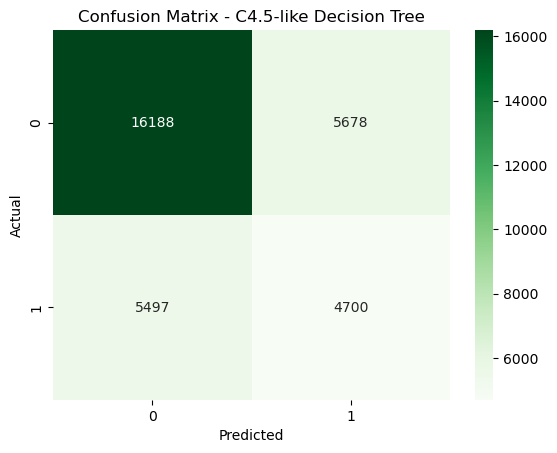

In [109]:
cm_c45 = confusion_matrix(y_test, y_pred_c45)

sns.heatmap(cm_c45, annot=True, fmt="d", cmap="Greens")

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - C4.5-like Decision Tree")
plt.show()

In [110]:
decision_tree_results = pd.DataFrame({
    "Model": ["CART Decision Tree", "C4.5-like Decision Tree"],
    "Accuracy": [
        accuracy_score(y_test, y_pred_cart),
        accuracy_score(y_test, y_pred_c45)
    ],
    "Precision": [
        precision_score(y_test, y_pred_cart),
        precision_score(y_test, y_pred_c45)
    ],
    "Recall": [
        recall_score(y_test, y_pred_cart),
        recall_score(y_test, y_pred_c45)
    ],
    "F1 Score": [
        f1_score(y_test, y_pred_cart),
        f1_score(y_test, y_pred_c45)
    ],
    "ROC-AUC": [
        roc_auc_score(y_test, y_prob_cart),
        roc_auc_score(y_test, y_prob_c45)
    ]
})

decision_tree_results

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC
0,CART Decision Tree,0.646696,0.445745,0.455624,0.450630,0.595712
1,C4.5-like Decision Tree,0.651467,0.452881,0.460920,0.456865,0.600624


In [111]:
print("CART Training Accuracy:", cart_model.score(X_train_encoded, y_train))
print("CART Testing Accuracy:", cart_model.score(X_test_encoded, y_test))

print("C4.5 Training Accuracy:", c45_model.score(X_train_encoded, y_train))
print("C4.5 Testing Accuracy:", c45_model.score(X_test_encoded, y_test))

# Tree is overfitted

CART Training Accuracy: 0.9999844054580896
CART Testing Accuracy: 0.6466955681003025
C4.5 Training Accuracy: 0.9999844054580896
C4.5 Testing Accuracy: 0.6514674235099648


In [112]:
# Now we are using max_depth
cart_model_tuned = DecisionTreeClassifier(
    criterion="gini",
    max_depth=5,
    min_samples_split=50,
    min_samples_leaf=25,
    random_state=50
)

cart_model_tuned.fit(X_train_encoded, y_train)

y_pred_cart_tuned = cart_model_tuned.predict(X_test_encoded)
y_prob_cart_tuned = cart_model_tuned.predict_proba(X_test_encoded)[:, 1]

In [113]:
print("Tuned CART Decision Tree Results")
print("Accuracy:", accuracy_score(y_test, y_pred_cart_tuned))
print("Precision:", precision_score(y_test, y_pred_cart_tuned))
print("Recall:", recall_score(y_test, y_pred_cart_tuned))
print("F1 Score:", f1_score(y_test, y_pred_cart_tuned))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_cart_tuned))

print(classification_report(y_test, y_pred_cart_tuned))

Tuned CART Decision Tree Results
Accuracy: 0.7364875401553193
Precision: 0.6274424030329542
Recall: 0.42198685888006277
F1 Score: 0.5046027557900908
ROC-AUC: 0.7816196902005522
              precision    recall  f1-score   support

           0       0.77      0.88      0.82     21866
           1       0.63      0.42      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



In [114]:
c45_model_tuned = DecisionTreeClassifier(
    criterion="entropy",
    max_depth=5,
    min_samples_split=50,
    min_samples_leaf=25,
    random_state=50
)

c45_model_tuned.fit(X_train_encoded, y_train)

y_pred_c45_tuned = c45_model_tuned.predict(X_test_encoded)
y_prob_c45_tuned = c45_model_tuned.predict_proba(X_test_encoded)[:, 1]

In [115]:
print("Tuned C4.5-like Decision Tree Results")
print("Accuracy:", accuracy_score(y_test, y_pred_c45_tuned))
print("Precision:", precision_score(y_test, y_pred_c45_tuned))
print("Recall:", recall_score(y_test, y_pred_c45_tuned))
print("F1 Score:", f1_score(y_test, y_pred_c45_tuned))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_c45_tuned))

print(classification_report(y_test, y_pred_c45_tuned))

Tuned C4.5-like Decision Tree Results
Accuracy: 0.7362692199731778
Precision: 0.6299059841814655
Recall: 0.41394527802294795
F1 Score: 0.4995857497928749
ROC-AUC: 0.7807540958349635
              precision    recall  f1-score   support

           0       0.76      0.89      0.82     21866
           1       0.63      0.41      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



In [116]:
# Feature Importance

feature_importance = pd.DataFrame({
    "Feature": X_train_encoded.columns,
    "Importance": cart_model_tuned.feature_importances_
})

feature_importance = feature_importance.sort_values(
    by="Importance",
    ascending=False
)

feature_importance.head(15)

,Feature,Importance
10,Web_Purchase_Rate,0.970438
11,Engagement_Score,0.029272
23,Session_Duration_Log,0.000209
3,Annual_Income,0.000081
0,Pages_Viewed,0.000000
36,Campaign_Engagement_Level_Medium,0.000000
28,Traffic_Source_Paid Search,0.000000
29,Traffic_Source_Referral,0.000000
30,Traffic_Source_Social,0.000000
31,Traffic_Source_Unknown,0.000000


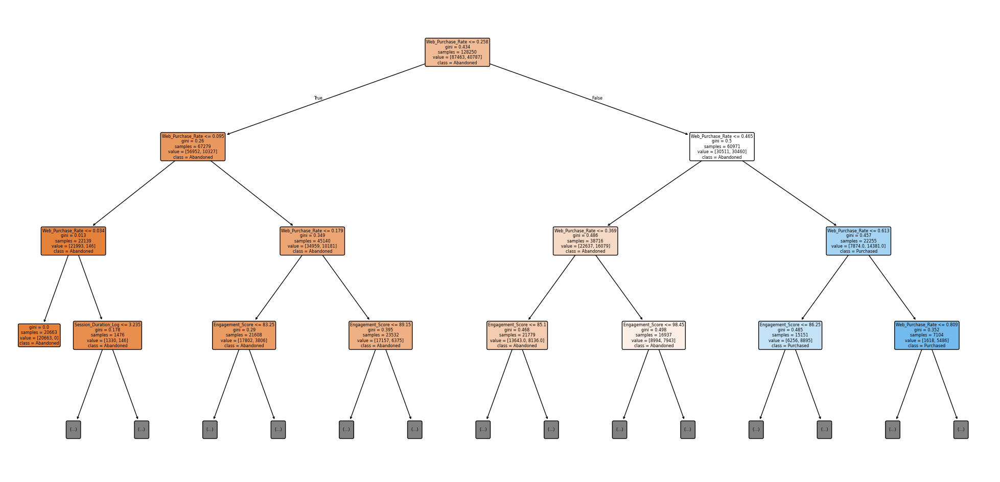

In [118]:
from sklearn.tree import plot_tree

plt.figure(figsize=(25,12))

plot_tree(
    cart_model_tuned,
    feature_names=X_train_encoded.columns,
    class_names=["Abandoned", "Purchased"],
    filled=True,
    rounded=True,
    max_depth=3
)

plt.show()

In [119]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

In [130]:
rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    max_features="sqrt",
    min_samples_split=50,
    min_samples_leaf=25,
    random_state=50,
    n_jobs=-1
)

rf_model.fit(X_train_encoded, y_train)

,n_estimators,200
,criterion,'gini'
,max_depth,10
,min_samples_split,50
,min_samples_leaf,25
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [131]:
y_pred_rf = rf_model.predict(X_test_encoded)

y_prob_rf = rf_model.predict_proba(X_test_encoded)[:, 1]

In [132]:
abandonment_risk_rf = 1 - y_prob_rf

In [133]:
print("Random Forest Basic Model Results")
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Precision:", precision_score(y_test, y_pred_rf))
print("Recall:", recall_score(y_test, y_pred_rf))
print("F1 Score:", f1_score(y_test, y_pred_rf))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_rf))
print(classification_report(y_test, y_pred_rf))

Random Forest Basic Model Results
Accuracy: 0.7349592988803294
Precision: 0.6673232223754185
Recall: 0.33225458468176916
F1 Score: 0.44362969752520626
ROC-AUC: 0.7813690484055168
              precision    recall  f1-score   support

           0       0.75      0.92      0.83     21866
           1       0.67      0.33      0.44     10197

    accuracy                           0.73     32063
   macro avg       0.71      0.63      0.63     32063
weighted avg       0.72      0.73      0.70     32063



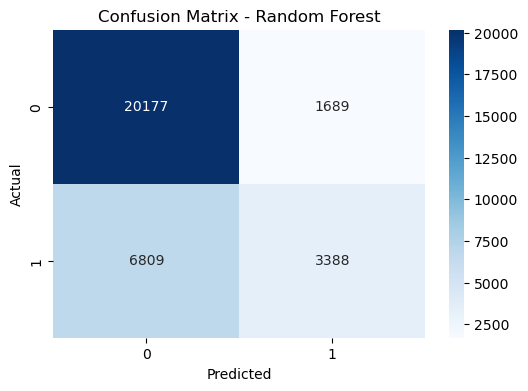

In [134]:
cm_rf = confusion_matrix(y_test, y_pred_rf)

plt.figure(figsize=(6,4))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues")

plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - Random Forest")
plt.show()

In [135]:
# Checking Overfitting

train_accuracy_rf = rf_model.score(X_train_encoded, y_train)
test_accuracy_rf = rf_model.score(X_test_encoded, y_test)

print("Training Accuracy:", train_accuracy_rf)
print("Testing Accuracy:", test_accuracy_rf)

Training Accuracy: 0.741130604288499
Testing Accuracy: 0.7349592988803294


In [136]:
# Feature Importance

rf_feature_importance = pd.DataFrame({
    "Feature": X_train_encoded.columns,
    "Importance": rf_model.feature_importances_
})

rf_feature_importance = rf_feature_importance.sort_values(
    by="Importance",
    ascending=False
)

rf_feature_importance.head(20)

,Feature,Importance
10,Web_Purchase_Rate,0.338723
16,Web_Buyer_Flag,0.184123
40,Web_Purchase_Level_High,0.154972
39,Web_Purchase_Level_Medium,0.087847
38,Web_Purchase_Level_Low,0.075889
11,Engagement_Score,0.025421
0,Pages_Viewed,0.017094
14,Loyalty_Score,0.014846
23,Session_Duration_Log,0.011258
1,Session_Duration,0.011228


In [138]:
business_rf_output = df_original.loc[X_test.index, ["Session_ID", "Customer_ID"]].copy()

business_rf_output["Actual_Purchase"] = y_test.values

business_rf_output["Purchase_Probability"] = y_prob_rf

business_rf_output["Abandonment_Risk"] = 1 - business_rf_output["Purchase_Probability"]

business_rf_output = business_rf_output.sort_values(
    by="Abandonment_Risk",
    ascending=False
)

business_rf_output.head(20)

,Session_ID,Customer_ID,Actual_Purchase,Purchase_Probability,Abandonment_Risk
19190,WEB00229960,C022661,0,0.004396,0.995604
125729,WEB00180646,C011750,0,0.004451,0.995549
143991,WEB00116517,C023726,0,0.005049,0.994951
159540,WEB00295171,C012868,0,0.005218,0.994782
25952,WEB00108592,C049362,0,0.005298,0.994702
126094,WEB00171635,C019851,0,0.005339,0.994661
51397,WEB00040691,C001216,0,0.005370,0.994630
78162,WEB00255889,C001301,0,0.005416,0.994584
55359,WEB00101066,C042804,0,0.005434,0.994566
9006,WEB00206124,C011515,0,0.005528,0.994472


In [139]:
rf_results = pd.DataFrame({
    "Model": ["Random Forest Basic"],
    "Accuracy": [accuracy_score(y_test, y_pred_rf)],
    "Precision": [precision_score(y_test, y_pred_rf)],
    "Recall": [recall_score(y_test, y_pred_rf)],
    "F1 Score": [f1_score(y_test, y_pred_rf)],
    "ROC-AUC": [roc_auc_score(y_test, y_prob_rf)],
    "Train Accuracy": [train_accuracy_rf],
    "Test Accuracy": [test_accuracy_rf]
})

rf_results

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC,Train Accuracy,Test Accuracy
0,Random Forest Basic,0.734959,0.667323,0.332255,0.44363,0.781369,0.741131,0.734959


In [140]:
# RandomSearch cv

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

param_dist = {
    "n_estimators": [100, 150, 200, 300],
    "max_depth": [5, 7, 10, 15, 20, None],
    "max_features": ["sqrt", "log2"],
    "min_samples_split": [20, 50, 100],
    "min_samples_leaf": [10, 25, 50],
    "class_weight": [None, "balanced"]
}

rf_random = RandomizedSearchCV(
    estimator=RandomForestClassifier(random_state=42, n_jobs=-1),
    param_distributions=param_dist,
    n_iter=20,
    scoring="roc_auc",
    cv=3,
    random_state=42,
    n_jobs=-1,
    verbose=2
)

rf_random.fit(X_train_encoded, y_train)

print("Best Parameters:", rf_random.best_params_)
print("Best CV ROC-AUC:", rf_random.best_score_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters: {'n_estimators': 150, 'min_samples_split': 50, 'min_samples_leaf': 25, 'max_features': 'sqrt', 'max_depth': 10, 'class_weight': 'balanced'}
Best CV ROC-AUC: 0.7786847186071202


In [141]:
best_rf_model = rf_random.best_estimator_

y_pred_rf_best = best_rf_model.predict(X_test_encoded)
y_prob_rf_best = best_rf_model.predict_proba(X_test_encoded)[:, 1]

print("Best Random Forest Results")
print("Accuracy:", accuracy_score(y_test, y_pred_rf_best))
print("Precision:", precision_score(y_test, y_pred_rf_best))
print("Recall:", recall_score(y_test, y_pred_rf_best))
print("F1 Score:", f1_score(y_test, y_pred_rf_best))
print("ROC-AUC:", roc_auc_score(y_test, y_prob_rf_best))

print("Train Accuracy:", best_rf_model.score(X_train_encoded, y_train))
print("Test Accuracy:", best_rf_model.score(X_test_encoded, y_test))

print(classification_report(y_test, y_pred_rf_best))

Best Random Forest Results
Accuracy: 0.680659950722016
Precision: 0.4986550531574228
Recall: 0.7635579091889771
F1 Score: 0.6033086668474681
ROC-AUC: 0.7814588641447557
Train Accuracy: 0.6833060428849903
Test Accuracy: 0.680659950722016
              precision    recall  f1-score   support

           0       0.85      0.64      0.73     21866
           1       0.50      0.76      0.60     10197

    accuracy                           0.68     32063
   macro avg       0.68      0.70      0.67     32063
weighted avg       0.74      0.68      0.69     32063



In [189]:
from sklearn.ensemble import GradientBoostingClassifier

gb_model = GradientBoostingClassifier(
    random_state=42
)

gb_model.fit(X_tree_train_encoded, y_train)

gb_result = evaluate_classification_model(
    "Gradient Boosting Basic",
    gb_model,
    X_tree_train_encoded,
    X_tree_test_encoded,
    y_train,
    y_test
)

Gradient Boosting Basic
--------------------------------------------------
                     Model  Accuracy  Precision    Recall  F1 Score   ROC-AUC  \
0  Gradient Boosting Basic   0.73839   0.635587  0.415809  0.502727  0.784943   

   Train Accuracy  Test Accuracy  
0         0.73823        0.73839  

Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.89      0.82     21866
           1       0.64      0.42      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



Gradient Boosting Tuned
--------------------------------------------------
Accuracy: 0.7376415182609238
Precision: 0.654491950839536
Recall: 0.3707953319603805
F1 Score: 0.4733942656817328
ROC-AUC: 0.7836902847437001
Train Accuracy: 0.7364600389863548
Test Accuracy: 0.7376415182609238

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.91      0.83     21866
           1       0.65      0.37      0.47     10197

    accuracy                           0.74     32063
   macro avg       0.71      0.64      0.65     32063
weighted avg       0.72      0.74      0.71     32063



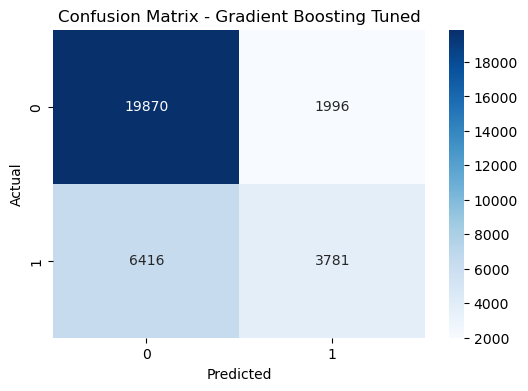

In [148]:
# Controlled Gradient Boosting

gb_tuned = GradientBoostingClassifier(
    n_estimators=150,
    learning_rate=0.05,
    max_depth=3,
    min_samples_split=50,
    min_samples_leaf=25,
    subsample=0.8,
    max_features="sqrt",
    random_state=42
)

gb_tuned.fit(X_train_encoded, y_train)

gb_tuned_result = evaluate_model(
    "Gradient Boosting Tuned",
    gb_tuned,
    X_train_encoded,
    X_test_encoded,
    y_train,
    y_test
)

AdaBoost Basic
--------------------------------------------------
Accuracy: 0.7333686804104419
Precision: 0.6333764972483005
Recall: 0.38374031577915074
F1 Score: 0.4779236641221374
ROC-AUC: 0.7687560343408097
Train Accuracy: 0.7329668615984406
Test Accuracy: 0.7333686804104419

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.90      0.82     21866
           1       0.63      0.38      0.48     10197

    accuracy                           0.73     32063
   macro avg       0.70      0.64      0.65     32063
weighted avg       0.72      0.73      0.71     32063



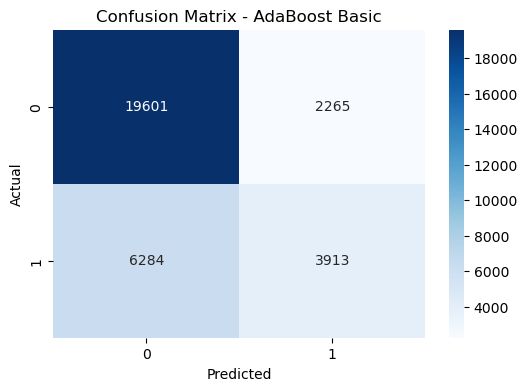

In [149]:
# Basic AdaBoost
from sklearn.ensemble import AdaBoostClassifier

ada_model = AdaBoostClassifier(
    n_estimators=100,
    learning_rate=0.5,
    random_state=50
)

ada_model.fit(X_train_encoded, y_train)

ada_result = evaluate_model(
    "AdaBoost Basic",
    ada_model,
    X_train_encoded,
    X_test_encoded,
    y_train,
    y_test
)

AdaBoost Tuned
--------------------------------------------------
Accuracy: 0.7349904874777782
Precision: 0.6418084751418085
Recall: 0.3772678238697656
F1 Score: 0.4752022728676425
ROC-AUC: 0.7813381784498
Train Accuracy: 0.7344171539961014
Test Accuracy: 0.7349904874777782

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.90      0.82     21866
           1       0.64      0.38      0.48     10197

    accuracy                           0.73     32063
   macro avg       0.70      0.64      0.65     32063
weighted avg       0.72      0.73      0.71     32063



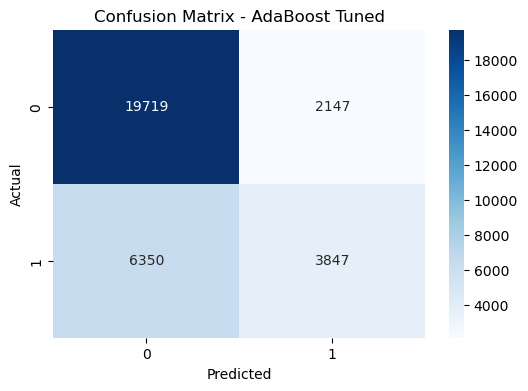

In [150]:
# AdaBoost with controlled base estimator

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier

base_tree = DecisionTreeClassifier(
    max_depth=2,
    min_samples_leaf=30,
    random_state=42
)

ada_tuned = AdaBoostClassifier(
    estimator=base_tree,
    n_estimators=150,
    learning_rate=0.05,
    random_state=42
)

ada_tuned.fit(X_train_encoded, y_train)

ada_tuned_result = evaluate_model(
    "AdaBoost Tuned",
    ada_tuned,
    X_train_encoded,
    X_test_encoded,
    y_train,
    y_test
)

In [192]:
#!pip install xgboost

In [147]:
from xgboost import XGBClassifier

XGBoost Basic
--------------------------------------------------
Accuracy: 0.7311854785890278
Precision: 0.6132644272179156
Recall: 0.41894674904383644
F1 Score: 0.4978150672959273
ROC-AUC: 0.7736325522306151
Train Accuracy: 0.7680935672514619
Test Accuracy: 0.7311854785890278

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.88      0.82     21866
           1       0.61      0.42      0.50     10197

    accuracy                           0.73     32063
   macro avg       0.69      0.65      0.66     32063
weighted avg       0.72      0.73      0.72     32063



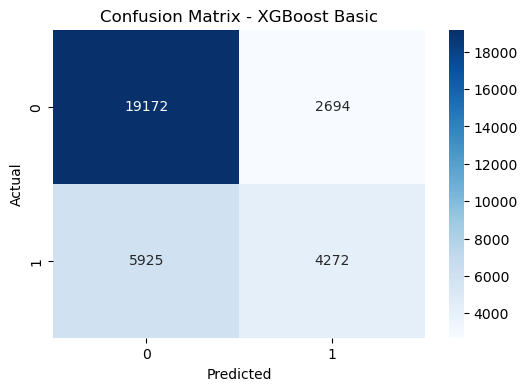

In [151]:
# Basic XGBoost

xgb_model = XGBClassifier(
    random_state=42,
    eval_metric="logloss"
)

xgb_model.fit(X_train_encoded, y_train)

xgb_result = evaluate_model(
    "XGBoost Basic",
    xgb_model,
    X_train_encoded,
    X_test_encoded,
    y_train,
    y_test
)

In [190]:
from xgboost import XGBClassifier

xgb_tuned = XGBClassifier(
    n_estimators=200,
    max_depth=4,
    learning_rate=0.05,
    gamma=0.1,
    reg_lambda=1,
    reg_alpha=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric="logloss"
)

xgb_tuned.fit(X_tree_train_encoded, y_train)

xgb_result = evaluate_classification_model(
    "XGBoost Tuned",
    xgb_tuned,
    X_tree_train_encoded,
    X_tree_test_encoded,
    y_train,
    y_test
)

XGBoost Tuned
--------------------------------------------------
           Model  Accuracy  Precision    Recall  F1 Score   ROC-AUC  \
0  XGBoost Tuned  0.738827   0.638505  0.412082  0.500894  0.784839   

   Train Accuracy  Test Accuracy  
0        0.739064       0.738827  

Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.89      0.82     21866
           1       0.64      0.41      0.50     10197

    accuracy                           0.74     32063
   macro avg       0.70      0.65      0.66     32063
weighted avg       0.72      0.74      0.72     32063



In [154]:
boosting_results = pd.DataFrame([
    gb_result,
    gb_tuned_result,
    ada_result,
    ada_tuned_result,
    xgb_result,
    xgb_tuned_result,
])

boosting_results.sort_values(by="ROC-AUC", ascending=False)

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC,Train Accuracy,Test Accuracy
0,Gradient Boosting Basic,0.738390,0.635587,0.415809,0.502727,0.784941,0.738230,0.738390
5,XGBoost Tuned,0.738234,0.637291,0.410611,0.499433,0.784911,0.738698,0.738234
1,Gradient Boosting Tuned,0.737642,0.654492,0.370795,0.473394,0.783690,0.736460,0.737642
3,AdaBoost Tuned,0.734990,0.641808,0.377268,0.475202,0.781338,0.734417,0.734990
4,XGBoost Basic,0.731185,0.613264,0.418947,0.497815,0.773633,0.768094,0.731185
2,AdaBoost Basic,0.733369,0.633376,0.383740,0.477924,0.768756,0.732967,0.733369


In [155]:
xgb_importance = pd.DataFrame({
    "Feature": X_train_encoded.columns,
    "Importance": xgb_tuned.feature_importances_
})

xgb_importance = xgb_importance.sort_values(
    by="Importance",
    ascending=False
)

xgb_importance.head(20)

,Feature,Importance
16,Web_Buyer_Flag,0.233559
38,Web_Purchase_Level_Low,0.223459
39,Web_Purchase_Level_Medium,0.183738
10,Web_Purchase_Rate,0.168132
40,Web_Purchase_Level_High,0.075460
11,Engagement_Score,0.010647
13,High_Engagement_Flag,0.009133
0,Pages_Viewed,0.006225
14,Loyalty_Score,0.005927
1,Session_Duration,0.005302


In [156]:
business_xgb_output = df_original.loc[X_test.index, ["Session_ID", "Customer_ID"]].copy()

business_xgb_output["Actual_Purchase"] = y_test.values
business_xgb_output["Purchase_Probability"] = xgb_tuned.predict_proba(X_test_encoded)[:, 1]
business_xgb_output["Abandonment_Risk"] = 1 - business_xgb_output["Purchase_Probability"]

business_xgb_output.sort_values("Abandonment_Risk", ascending=False).head(20)

,Session_ID,Customer_ID,Actual_Purchase,Purchase_Probability,Abandonment_Risk
103771,WEB00084781,C005391,0,0.000173,0.999827
73445,WEB00019531,C043774,0,0.000174,0.999826
127296,WEB00158585,C048163,0,0.000177,0.999823
97034,WEB00184787,C028843,0,0.000177,0.999823
149017,WEB00232546,C039539,0,0.000178,0.999822
115894,WEB00184546,C006064,0,0.000179,0.999821
65105,WEB00110209,C040727,0,0.000179,0.999821
141101,WEB00012527,C006482,0,0.000179,0.999821
67809,WEB00216101,C001776,0,0.000179,0.999821
45696,WEB00173068,C000915,0,0.000180,0.999820


In [191]:
final_results = pd.DataFrame([
    log_result,
    gb_result,
    xgb_result
])

final_results.sort_values(by="ROC-AUC", ascending=False)

,Model,Accuracy,Precision,Recall,F1 Score,ROC-AUC,Train Accuracy,Test Accuracy
0,Logistic Regression,0.737486,0.630844,0.420810,0.504853,0.785443,0.737388,0.737486
1,Gradient Boosting Basic,0.738390,0.635587,0.415809,0.502727,0.784943,0.738230,0.738390
2,XGBoost Tuned,0.738827,0.638505,0.412082,0.500894,0.784839,0.739064,0.738827
